In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering, KMeans, MiniBatchKMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import GridSearchCV
!pip install category_encoders
import category_encoders as ce
import time
import umap
from google.colab import drive
import seaborn as sns
sns.set()
import warnings

     |████████████████████████████████| 102kB 2.9MB/s 


In [0]:
warnings.filterwarnings('ignore')

# Introduction

My data set was found on Kaggle. It was initially sourced from the Airbnb site by [InsideAirbnb](https://insideairbnb.com/get-the-data.html). 

InsideAirbnb claims to have "analyzed, cleansed, and aggregated" the data.

This data set contains information on properties used for rental through Airbnb. It includes information about the listings, the individuals who listed the properties, price, reviews, and other profile information. There is geographical data as well. This data is from New York City Airbnb listings.


https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data

## Research Question

How can I make recommendations for Airbnb hosts to improve their listings in New York City? 

I will use clustering methods to derive recommendations. 

In [0]:
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
df = pd.read_csv('gdrive/My Drive/AB_NYC_2019.csv')

In [0]:
df.head()

In [0]:
df.drop(['id', 'host_id'], axis=1, inplace=True)

Check for missing values

In [0]:
df.isna().sum()

name                                 16
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [0]:
# examine missing values for host_name

df[df['host_name'].isna()]

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
360,Bienvenue,NaN,Queens,Queens Village,40.72413,-73.76133,Private room,50,1,43,2019-07-08,0.45,1,88
2700,Cozy Studio in Flatbush,NaN,Brooklyn,Flatbush,40.64965,-73.96154,Entire home/apt,100,30,49,2017-01-02,0.69,1,342
5745,SPRING in the City!! Zen-Style Tranquil Bedroom,NaN,Manhattan,Harlem,40.80606,-73.95061,Private room,86,3,34,2019-05-23,1.00,1,359
6075,Charming Room in Prospect Heights!,NaN,Brooklyn,Crown Heights,40.67512,-73.96146,Private room,50,1,0,NaN,NaN,1,0
6582,"Luxurious, best location, spa inc'l",NaN,Brooklyn,Greenpoint,40.72035,-73.95355,Entire home/apt,195,1,1,2015-10-20,0.02,1,0
8163,Modern Quiet Gem Near All,NaN,Brooklyn,East Flatbush,40.65263,-73.93215,Entire home/apt,85,2,182,2019-06-19,3.59,2,318
8257,"Sunny, Private room in Bushwick",NaN,Brooklyn,Bushwick,40.70146,-73.92792,Private room,37,1,1,2015-07-01,0.02,1,0
8852,R&S Modern Spacious Hideaway,NaN,Brooklyn,East Flatbush,40.64345,-73.93643,Entire home/apt,100,2,157,2019-06-19,3.18,2,342
9138,1 Bedroom in Prime Williamsburg,NaN,Brooklyn,Williamsburg,40.71838,-73.95630,Entire home/apt,145,1,0,NaN,NaN,1,0
9817,Sunny Room in Harlem,NaN,Manhattan,Harlem,40.82929,-73.94182,Private room,28,1,1,2015-08-01,0.02,1,0


In [0]:
df['host_name'].nunique()

11452

In [0]:
# examine missing values for name

df[df['name'].isna()]

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2854,NaN,Peter,Manhattan,Battery Park City,40.71239,-74.01620,Entire home/apt,400,1000,0,NaN,NaN,1,362
3703,NaN,Anna,Manhattan,East Village,40.73215,-73.98821,Entire home/apt,200,1,28,2015-06-08,0.45,1,341
5775,NaN,Jesse,Manhattan,Greenwich Village,40.73473,-73.99244,Entire home/apt,225,1,1,2015-01-01,0.02,1,0
5975,NaN,Michaël,Manhattan,Nolita,40.72046,-73.99550,Entire home/apt,215,7,5,2016-01-02,0.09,1,0
6269,NaN,Lucie,Brooklyn,Williamsburg,40.71370,-73.94378,Private room,150,1,0,NaN,NaN,1,0
6567,NaN,Carolina,Brooklyn,Bushwick,40.70046,-73.92825,Private room,70,1,0,NaN,NaN,1,0
6605,NaN,Josh,Manhattan,Washington Heights,40.85198,-73.93108,Private room,40,1,0,NaN,NaN,1,0
8841,NaN,Huei-Yin,Brooklyn,Williamsburg,40.71354,-73.93882,Private room,45,1,0,NaN,NaN,1,0
11963,NaN,Jonathan,Manhattan,Hell's Kitchen,40.76436,-73.98573,Entire home/apt,190,4,1,2016-01-05,0.02,1,0
12824,NaN,Miguel,Manhattan,Harlem,40.80316,-73.95189,Entire home/apt,300,5,0,NaN,NaN,5,0


In [0]:
df['name'].nunique()

47905

Fill missing values

- Missing host_name fill with 'Anonymous' because other data exists for the those columns so the host name must have been left blank

- Missing name fill with neighbourhood and room_type values since that will describe the space accurately

- Missing reviews_per_month fill with 0 since the rate of no reviews would be 0/month


In [0]:
# convert to datetime

df['last_review'] = pd.to_datetime(df['last_review'])

print(df['last_review'].min())
print(df['last_review'].max())

2011-03-28 00:00:00
2019-07-08 00:00:00


Due to the time series component, I will be dropping this column and performing this experiement without the time series component.

In [0]:
# fill missing values according to approach explained above

df['host_name'].fillna(value='Anonymous', inplace=True)

df['name'].fillna(
    value=df['neighbourhood'] + df['room_type'], axis=0, inplace=True
    )

df['reviews_per_month'].fillna(value=0, inplace=True)

In [0]:
df.isna().sum()

name                                  0
host_name                             0
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                     0
calculated_host_listings_count        0
availability_365                      0
dtype: int64

I will also be dropping host_name and name from the data set since I have run my models with those fields included and I think they are just contributing a lot of noise, and I am unable to get good separation among clusters.

## Exploratory Data Analysis

In [0]:
df.shape

(48895, 14)

In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 14 columns):
name                              48895 non-null object
host_name                         48895 non-null object
neighbourhood_group               48895 non-null object
neighbourhood                     48895 non-null object
latitude                          48895 non-null float64
longitude                         48895 non-null float64
room_type                         48895 non-null object
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
number_of_reviews                 48895 non-null int64
last_review                       38843 non-null datetime64[ns]
reviews_per_month                 48895 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64
dtypes: datetime64[ns](1), float64(3), int64(5), object(5)
memory usage: 5.2+ MB


In [0]:
# making lists for sorting data by type 

objects = [column for column in df if df[column].dtype == 'object']
dates = [column for column in df if df[column].dtype == 'datetime64[ns]']
numbers = [column for column in df if df[column].dtype == 'int64' or df[column].dtype == 'float64']

print(objects)
print(dates)
print(numbers)

['name', 'host_name', 'neighbourhood_group', 'neighbourhood', 'room_type']
['last_review']
['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']


In [0]:
# see unique values for feature engineering consideration

for col in df:
    print('{} \n'.format(col), df[col].nunique())

name 
 47920
host_name 
 11453
neighbourhood_group 
 5
neighbourhood 
 221
latitude 
 19048
longitude 
 14718
room_type 
 3
price 
 674
minimum_nights 
 109
number_of_reviews 
 394
last_review 
 1764
reviews_per_month 
 938
calculated_host_listings_count 
 47
availability_365 
 366


In [0]:
df_corr = df[numbers].corr()
df_corr

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
latitude,1.000000,0.084788,0.033939,0.024869,-0.015389,-0.018758,0.019517,-0.010983
longitude,0.084788,1.000000,-0.150019,-0.062747,0.059094,0.138516,-0.114713,0.082731
price,0.033939,-0.150019,1.000000,0.042799,-0.047954,-0.050564,0.057472,0.081829
minimum_nights,0.024869,-0.062747,0.042799,1.000000,-0.080116,-0.124905,0.127960,0.144303
number_of_reviews,-0.015389,0.059094,-0.047954,-0.080116,1.000000,0.589407,-0.072376,0.172028
reviews_per_month,-0.018758,0.138516,-0.050564,-0.124905,0.589407,1.000000,-0.047312,0.163732
calculated_host_listings_count,0.019517,-0.114713,0.057472,0.127960,-0.072376,-0.047312,1.000000,0.225701
availability_365,-0.010983,0.082731,0.081829,0.144303,0.172028,0.163732,0.225701,1.000000


In [0]:
# view correlations for each variable to see what the highest and lowest are

for column in df_corr:
    highest = sorted(df_corr[column])[-2]
    lowest = sorted(df_corr[column])[0]
    print('Correlations with other variables for "{}" \n\
    Highest: r = {}, Lowest: r = {}\n'.format(column, highest, lowest))


Correlations with other variables for "latitude" 
    Highest: r = 0.0847883683891436, Lowest: r = -0.018757727123991375

Correlations with other variables for "longitude" 
    Highest: r = 0.1385161659533792, Lowest: r = -0.15001926996895285

Correlations with other variables for "price" 
    Highest: r = 0.08182882742169546, Lowest: r = -0.15001926996895285

Correlations with other variables for "minimum_nights" 
    Highest: r = 0.14430306319926703, Lowest: r = -0.124904965115965

Correlations with other variables for "number_of_reviews" 
    Highest: r = 0.5894072970833851, Lowest: r = -0.08011606824162393

Correlations with other variables for "reviews_per_month" 
    Highest: r = 0.5894072970833851, Lowest: r = -0.124904965115965

Correlations with other variables for "calculated_host_listings_count" 
    Highest: r = 0.2257013721911263, Lowest: r = -0.11471279117314984

Correlations with other variables for "availability_365" 
    Highest: r = 0.2257013721911263, Lowest: r = -0.

No strong correlations among continuous variables. The highest correlations observed are non-explanatory. For example, highest positive correlations are between "number_of_reviews" and "reviews_per_month" and the highest negative correlations are among "price" and "longitude".

There is a fairly weak correlation between "availability_365" and "calculated_host_listings_count" which interesting to me since it is not intuitive that the individual listing's availability would correlate with the number of total listings a host has.

In [0]:
df['neighbourhood'].nunique()

221

In [0]:
df['neighbourhood'].value_counts().nlargest(15)

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
Hell's Kitchen        1958
East Village          1853
Upper East Side       1798
Crown Heights         1564
Midtown               1545
East Harlem           1117
Greenpoint            1115
Chelsea               1113
Lower East Side        911
Astoria                900
Name: neighbourhood, dtype: int64

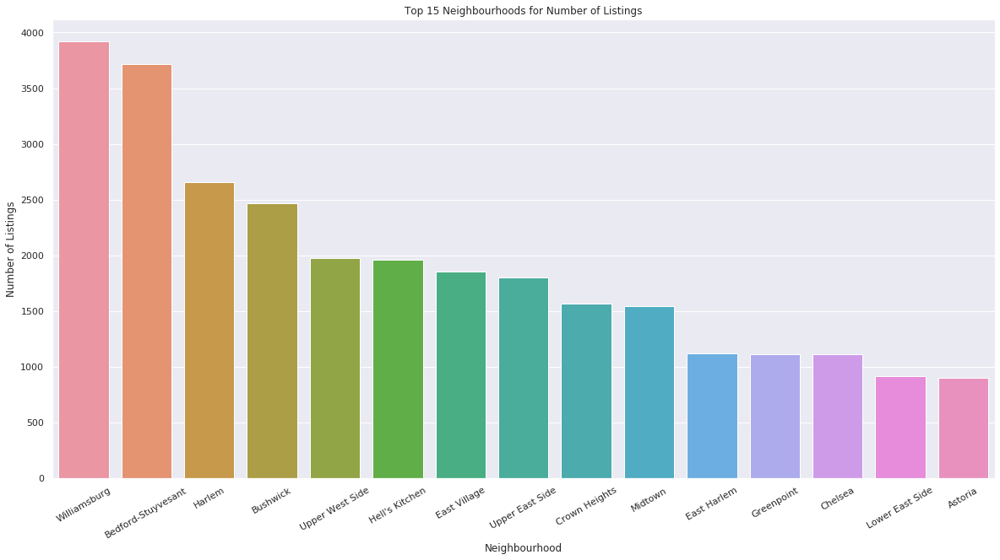

In [0]:
plt.figure(figsize=(20,10))

sns.barplot(x=df['neighbourhood'].value_counts().nlargest(15).index, 
            y=df['neighbourhood'].value_counts().nlargest(15))

plt.xticks(rotation=30)
plt.title('Top 15 Neighbourhoods for Number of Listings')
plt.xlabel('Neighbourhood')
plt.ylabel('Number of Listings')
plt.show()

Williamsburg neighbourhood has most listings.

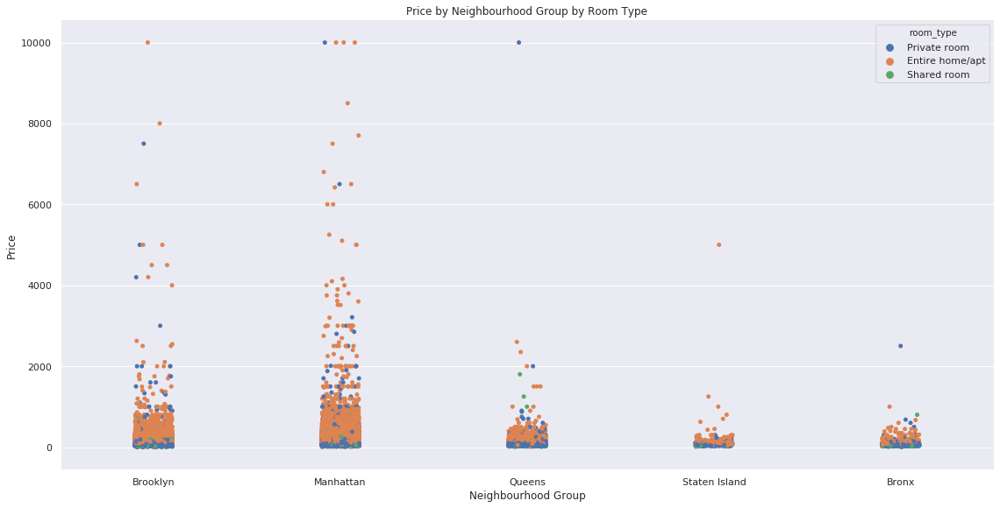

In [0]:
sns.catplot(x='neighbourhood_group', 
            y='price', 
            data=df, 
            height=8, 
            hue='room_type',
            aspect=2,
            legend_out=False)

plt.title('Price by Neighbourhood Group by Room Type')
plt.ylabel('Price')
plt.xlabel('Neighbourhood Group')
plt.show()

Aside from 1 outlier in Queens, Queens, Staten Island and the Bronx have the most affordable listings. 

The distribution of room types is fairly consistent throughout the neighbourhood groups and shared rooms tend to be cheaper.

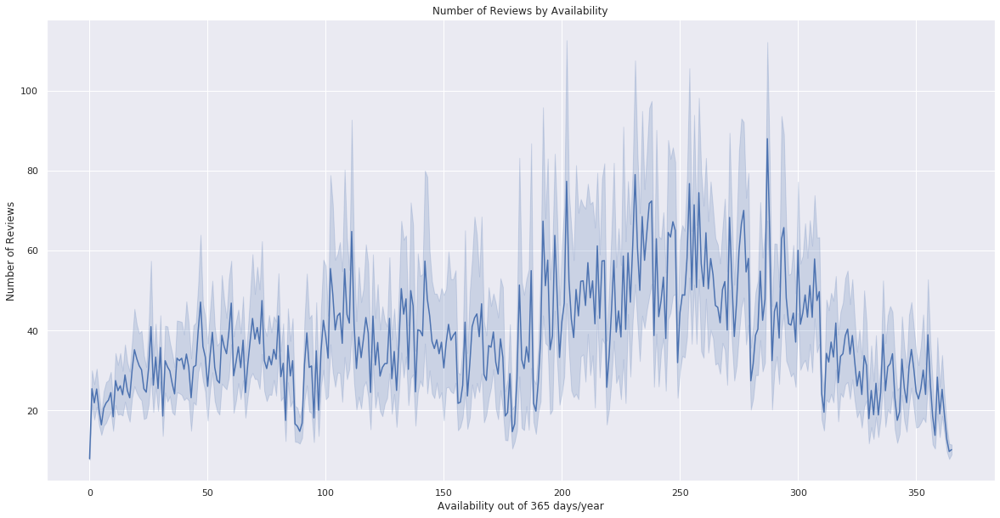

In [0]:
plt.figure(figsize=(20,10))

sns.lineplot(x='availability_365', 
             y='number_of_reviews', 
             data=df)

plt.title('Number of Reviews by Availability')
plt.xlabel('Availability out of 365 days/year')
plt.ylabel('Number of Reviews')
plt.show()

Listings that are available between 200 and 300 days a year have the most reviews.

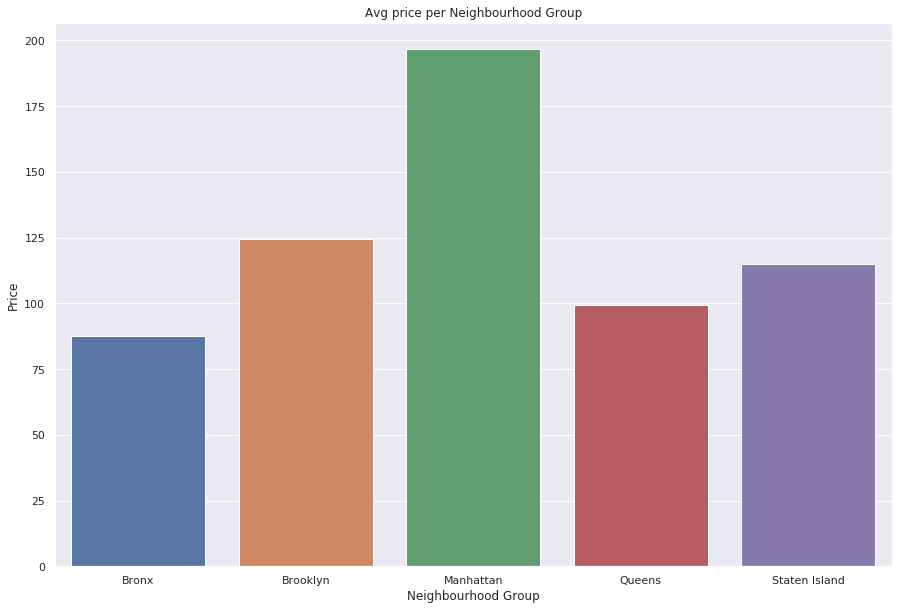

In [0]:
plt.figure(figsize=(15,10))

sns.barplot(x=df.groupby('neighbourhood_group')['price'].mean().index, 
            y=df.groupby('neighbourhood_group')['price'].mean())

plt.title(
    'Avg price per {}'.format('neighbourhood_group'.title().replace('_', ' '))
    )

plt.xlabel('neighbourhood_group'.title().replace('_', ' '))
plt.ylabel('price'.title().replace('_', ' '))
plt.show()

Manhattan is the most expensive neighbourhood group on average and the other 4 neighbourhood groups seem to be within $40 dollars per night on averge.

In [0]:
df['room_type'].value_counts()

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

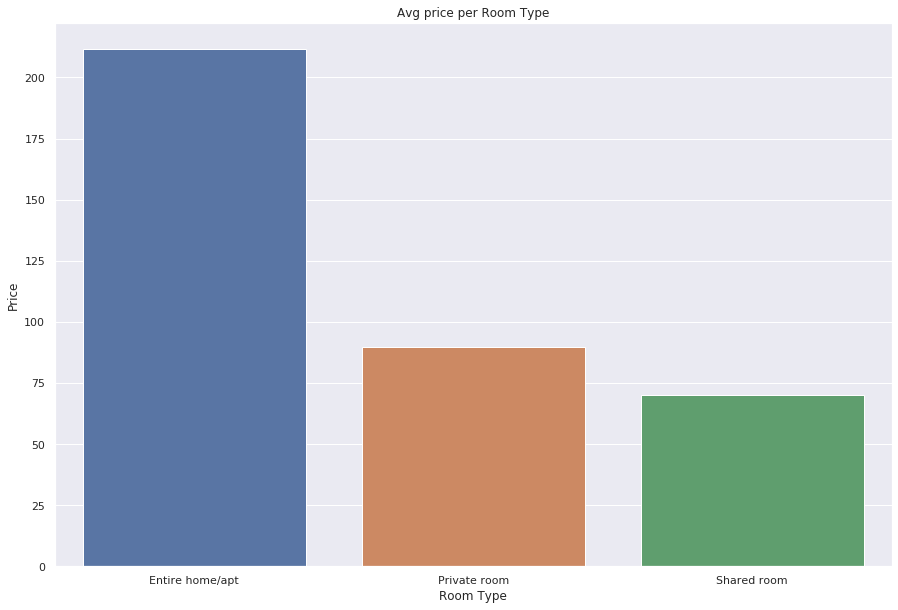

In [0]:
plt.figure(figsize=(15,10))

sns.barplot(x=df.groupby('room_type')['price'].mean().index, 
            y=df.groupby('room_type')['price'].mean())

plt.title('Avg price per {}'.format('room_type'.title().replace('_', ' ')))
plt.xlabel('room_type'.title().replace('_', ' '))
plt.ylabel('price'.title().replace('_', ' '))
plt.show()

Entire homes/apartments are far and away the most expensive option on average.

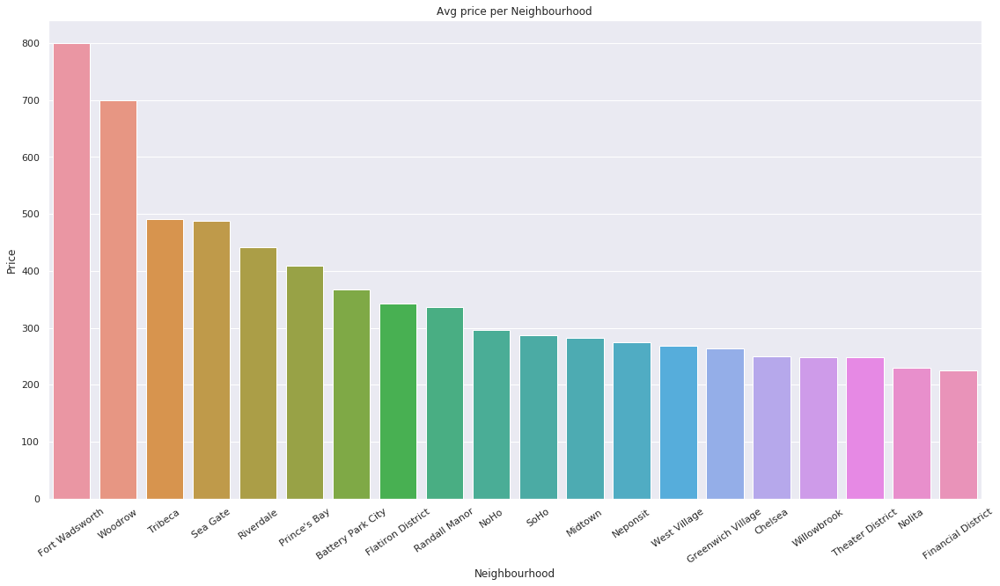

In [0]:
plt.figure(figsize=(19,10))

sns.barplot(
    x=df.groupby('neighbourhood')['price'].mean().nlargest(20).index, 
    y=df.groupby('neighbourhood')['price'].mean().nlargest(20)
    )

plt.title('Avg price per {}'.format('neighbourhood'.title().replace('_', ' ')))
plt.xticks(rotation=35)
plt.xlabel('neighbourhood'.title().replace('_', ' '))
plt.ylabel('price'.title().replace('_', ' '))
plt.show()

The Fort Wadsworth and Woodrow neighbourhoods are most expensive by several hundred dollars per night on average.

Interestingly, neither of those neighbourhoods were near the top for most listings in a neighbourhood.

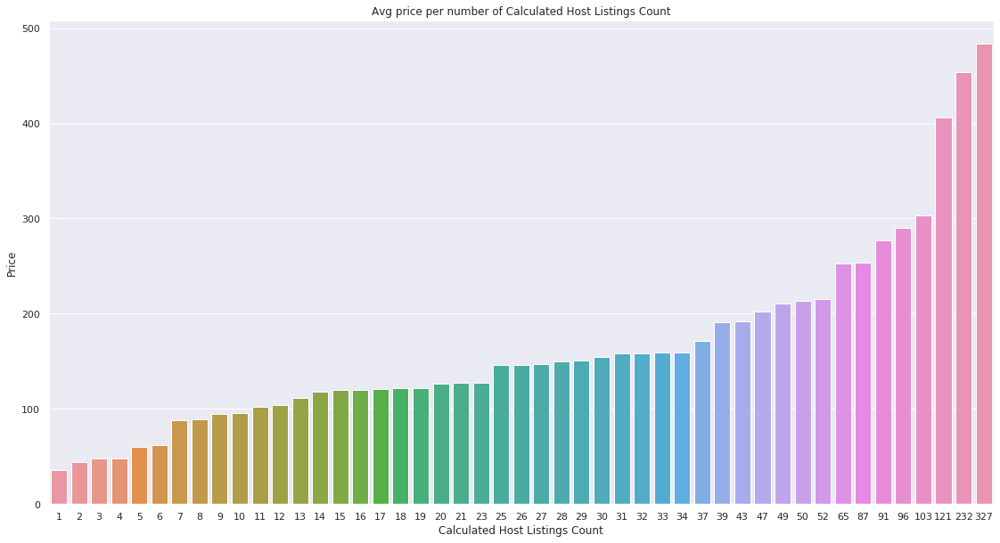

In [0]:
plt.figure(figsize=(19,10))

sns.barplot(
    x=sorted(df.groupby('calculated_host_listings_count')['price'].mean().index), 
    y=sorted(df.groupby('calculated_host_listings_count')['price'].mean())
    )

plt.title('Avg price per number of {}'.format(
    'calculated_host_listings_count'.title().replace('_', ' ')))
    
plt.xlabel('calculated_host_listings_count'.title().replace('_', ' '))
plt.ylabel('price'.title().replace('_', ' '))
plt.show()

There seems to be a linear relationship between average price per night and number of total listings per host. Hosts seems to charge more on average when they increase their total number of listings.

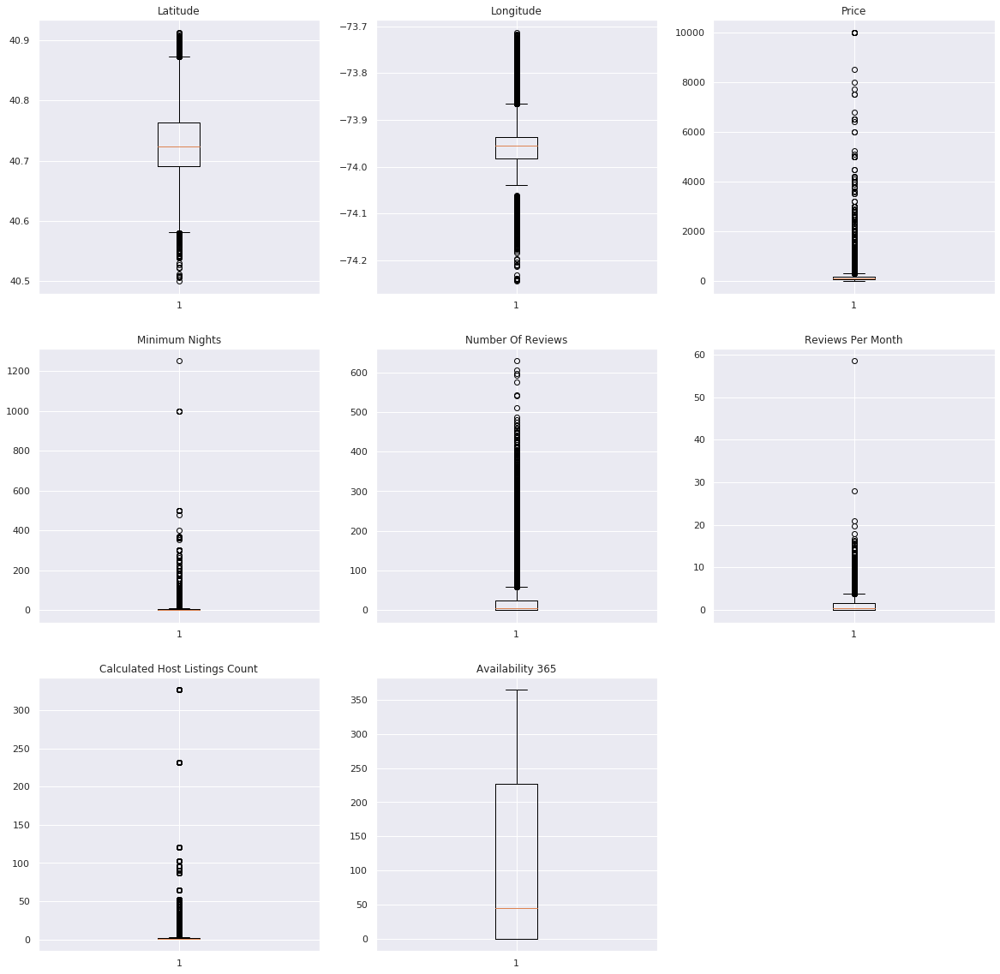

In [0]:
plt.figure(figsize=(20,20))

for i, col in enumerate(df[numbers]):
    plt.subplot(3,3, i+1)
    plt.boxplot(df[col])
    plt.title(col.title().replace('_', ' '))

plt.tight_layout
plt.show()

Almost all continuous variables have outliers. This will not be an issue since I will be standardizing all data before modeling with unsupervised models.

## Feature Engineering

First I created numeric values for categorical variables with strings as values. One-hot encoding would have ballooned the dimensionality and made the data density very sparse.

In [0]:
# function to create numeric values from string categorical values

def transform_strings(df):
    for col in df:
        if df[col].dtype == 'object':
            col_nums = {'nums': [range(len(df[col].unique()))]}

            # create ordinal numbering

            df[col] = ce.OrdinalEncoder(
                cols='{}'.format(col)).fit_transform(df[col], col_nums['nums']
                )
                
    return df[col]


In [0]:
transform_strings(df)

0        365
1        355
2        365
3        194
4          0
        ... 
48890      9
48891     36
48892     27
48893      2
48894     23
Name: availability_365, Length: 48895, dtype: int64

Make a new dataframe independent of time-series.

In [0]:
df_no_time = df.drop(['last_review'], axis=1)

Create a feature that looks at overall cost by multiplying the price per night by the minimum number of nights to get total cost per rental.

In [0]:
df_no_time['total_cost_rental'] = df_no_time['price']*df_no_time['minimum_nights']

In [0]:
df_no_time.head()

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,total_cost_rental
0,1,1,1,1,40.64749,-73.97237,1,149,1,9,0.21,6,365,149
1,2,2,2,2,40.75362,-73.98377,2,225,1,45,0.38,2,355,225
2,3,3,2,3,40.80902,-73.94190,1,150,3,0,0.00,1,365,450
3,4,4,1,4,40.68514,-73.95976,2,89,1,270,4.64,1,194,89
4,5,5,2,5,40.79851,-73.94399,2,80,10,9,0.10,1,0,800


In [0]:
df_no_time.drop(['host_name', 'name'], axis=1, inplace=True)

In [0]:
df_no_time.shape

(48895, 12)

In [0]:
df_no_time.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,total_cost_rental
0,1,1,40.64749,-73.97237,1,149,1,9,0.21,6,365,149
1,2,2,40.75362,-73.98377,2,225,1,45,0.38,2,355,225
2,2,3,40.80902,-73.94190,1,150,3,0,0.00,1,365,450
3,1,4,40.68514,-73.95976,2,89,1,270,4.64,1,194,89
4,2,5,40.79851,-73.94399,2,80,10,9,0.10,1,0,800


## Dimensionality Reduction & Visualization

In [0]:
X = df_no_time[numbers]
X.drop(['latitude', 'longitude'], axis=1, inplace=True)
X_stand = StandardScaler().fit_transform(X)

In [0]:
pca = PCA(n_components=2)
comps = pca.fit_transform(X_stand)

In [0]:
# calculating the explained variance

sum(pca.explained_variance_ratio_)

0.5097532651265231

The 2 components to be used for visualization capture about 51% of the information from the data set.

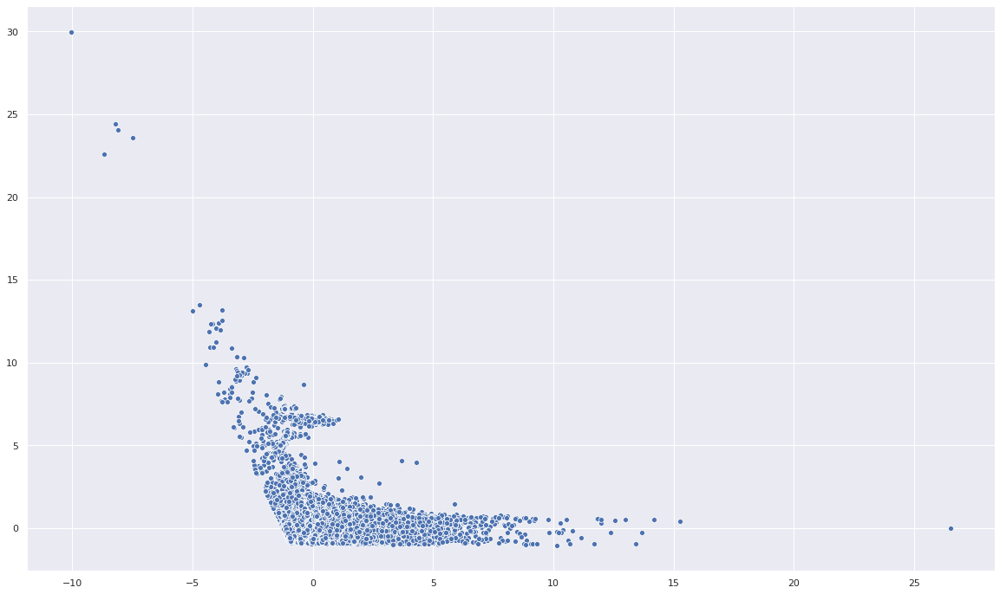

In [0]:
plt.figure(figsize=(20,12))

sns.scatterplot(x=comps[:,0], y=comps[:,1])
plt.show()

No clusters are evident following PCA visualization. However, this is only showing 51% of the variance in the data.

Plotting each feature on the PCA components.

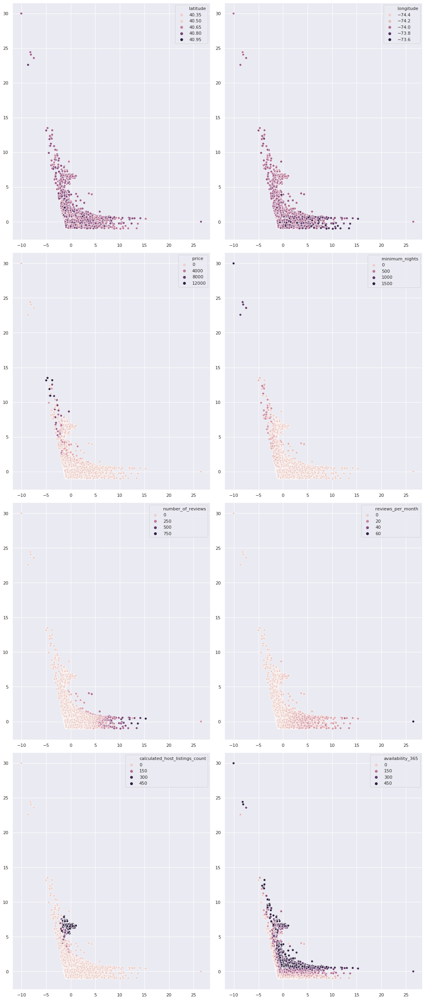

In [0]:
plt.figure(figsize=(15,35))

for i, col in enumerate(df_no_time[numbers]):
    plt.subplot(4,2,i+1)
    sns.scatterplot(x=comps[:,0], y=comps[:,1], hue=col, 
                    data=df_no_time[numbers])

plt.tight_layout()
plt.show()

Trying t-SNE for visualization.

In [0]:
tsne = TSNE(n_components=2, n_iter=400, perplexity=30).fit_transform(X_stand)
print('Done!')

Done!


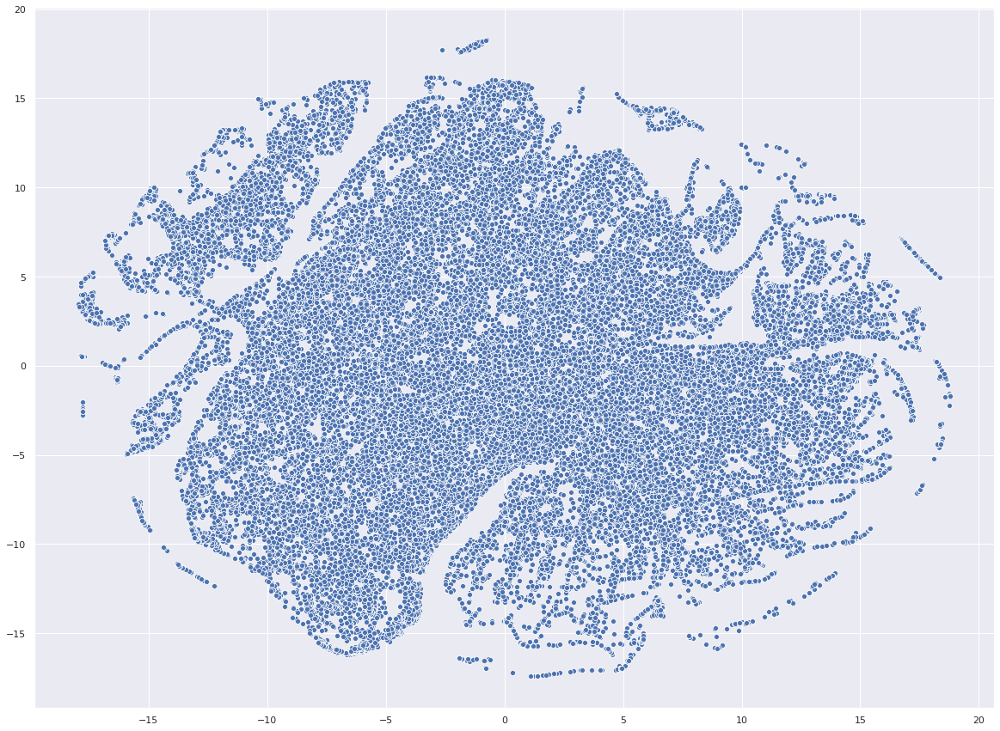

In [0]:
plt.figure(figsize=(20,15))

sns.scatterplot(x=tsne[:,0], y=tsne[:,1])
plt.show()

t-SNE revealed no distinct clusters.

Plotting all features on the two t-SNE components.

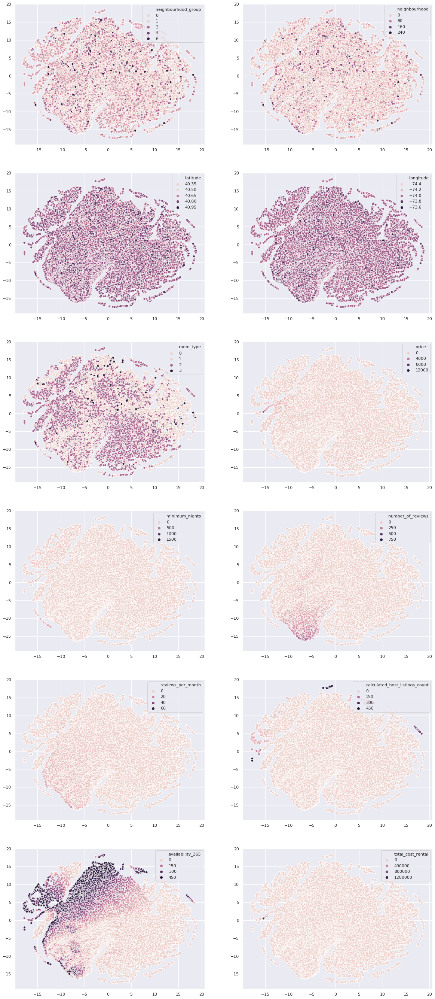

In [0]:
plt.figure(figsize=(20,65))

for i, col in enumerate(df_no_time):
    plt.subplot(8,2,i+1)
    sns.scatterplot(x=tsne[:,0], y=tsne[:,1], hue=col, data=df_no_time)
   
plt.show()

Trying UMAP for visualization.

In [0]:
u_map = umap.UMAP(
    n_neighbors=25, 
    min_dist=0.7, 
    metric='correlation'
    ).fit_transform(X_stand)

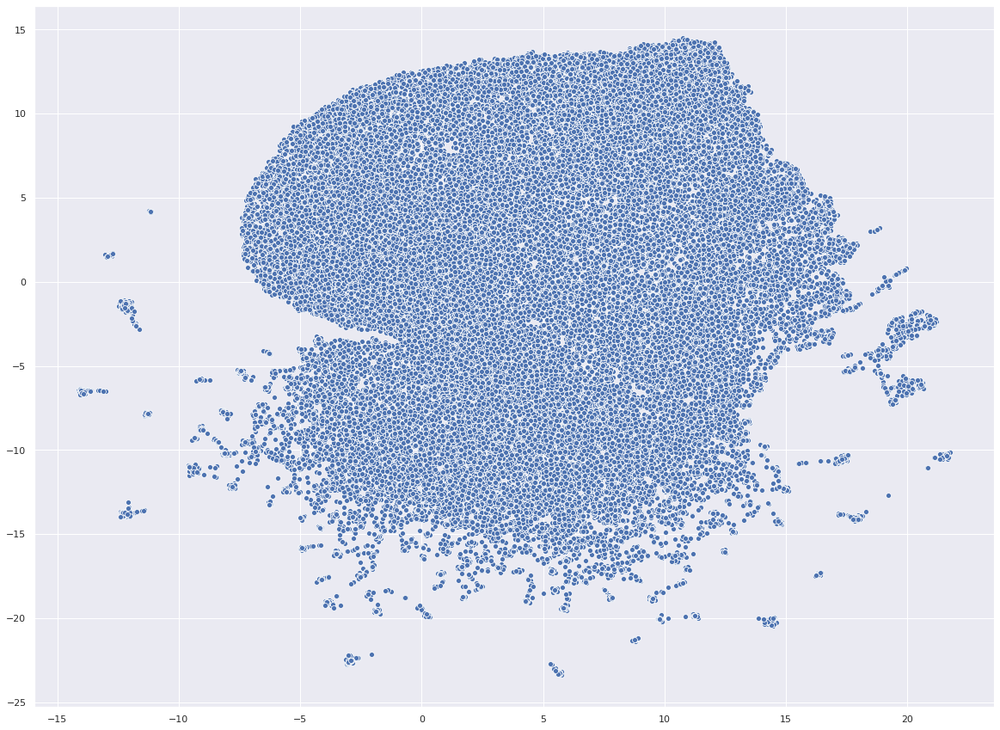

In [0]:
plt.figure(figsize=(20,15))

sns.scatterplot(x=u_map[:,0], y=u_map[:,1])
plt.show()

UMAP doesn't show any separation for clusters.

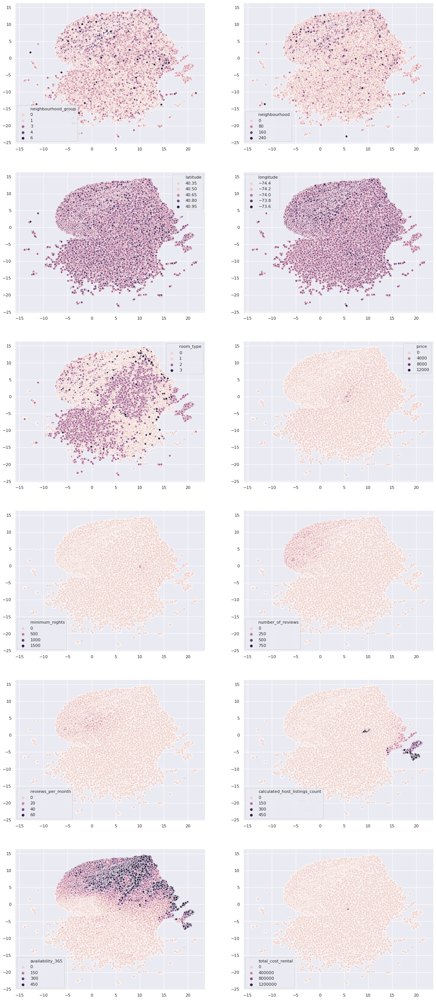

In [0]:
plt.figure(figsize=(20,65))

for i, col in enumerate(df_no_time):
    plt.subplot(8,2,i+1)
    sns.scatterplot(x=u_map[:,0], y=u_map[:,1], hue=col, data=df_no_time)
   
plt.show()

## Run Models

KMeans

GridSearchCV tuned KMeans model

In [0]:
k_means = KMeans(n_clusters=108, n_jobs=-1, random_state=1232).fit(X_stand)
k_clusters = k_means.predict(X_stand)

In [0]:
params = {'n_clusters' : np.arange(105, 110, 1)}
grid_k_means = GridSearchCV(k_means, params, n_jobs=-1)

grid_k_means.fit(X_stand)

GridSearchCV(cv=None, error_score=nan,
             estimator=KMeans(algorithm='auto', copy_x=True, init='k-means++',
                              max_iter=300, n_clusters=108, n_init=10,
                              n_jobs=-1, precompute_distances='auto',
                              random_state=1232, tol=0.0001, verbose=0),
             iid='deprecated', n_jobs=-1,
             param_grid={'n_clusters': array([100, 101, 102, 103, 104, 105, 106, 107, 108, 109])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

Best KMeans Model

In [0]:
grid_k_means.best_estimator_

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=108, n_init=10, n_jobs=-1, precompute_distances='auto',
       random_state=1232, tol=0.0001, verbose=0)

In [0]:
silhouette_score(X_stand, k_clusters, metric='euclidean')

0.2589954859718631

108 clusters is too impractical to be useful for Airbnb hosts. I will look at the elbow plot of inertia to see if there may be a more manageable cluster amount. While GridSearchCV is working to optimize the loss function, that doesn't necessarily result in the most useful model for determining clusters.

In [0]:
pressure = []
for i in range(1,109,10):
    k_means = KMeans(n_clusters=i, n_jobs=-1, random_state=1232).fit(X_stand)
    pressure.append(k_means.inertia_)


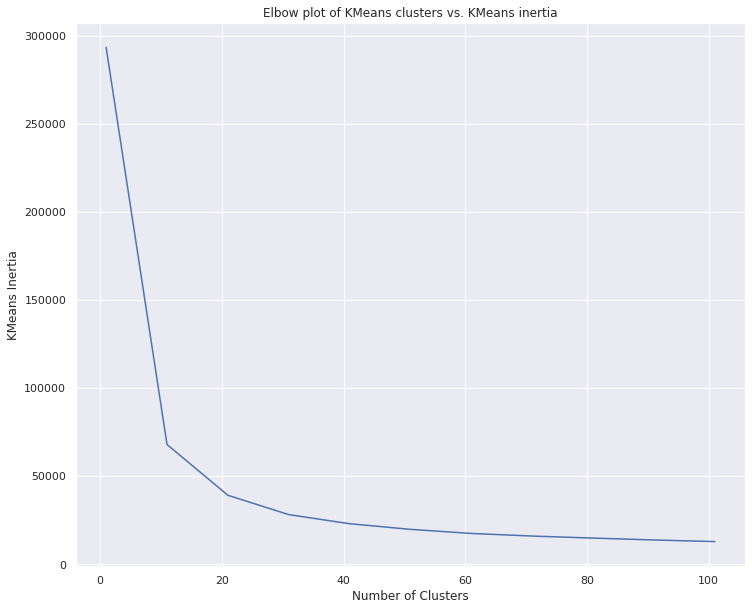

In [0]:
plt.figure(figsize=(12,10))
plt.plot(list(range(1,109, 10)), pressure)
plt.title('Elbow plot of KMeans clusters vs. KMeans inertia')
plt.ylabel('KMeans Inertia')
plt.xlabel('Number of Clusters')
plt.show()

The elbow plot shows a stark change in the curve around 20 clusters. I will run KMeans using this figure to see the difference in the plot and silhouette score.

In [0]:
k_means = KMeans(n_clusters=20, n_jobs=-1, random_state=1232).fit(X_stand)
k_clusters = k_means.predict(X_stand)

In [0]:
silhouette_score(X_stand, k_clusters, metric='euclidean')

0.37457839821120975

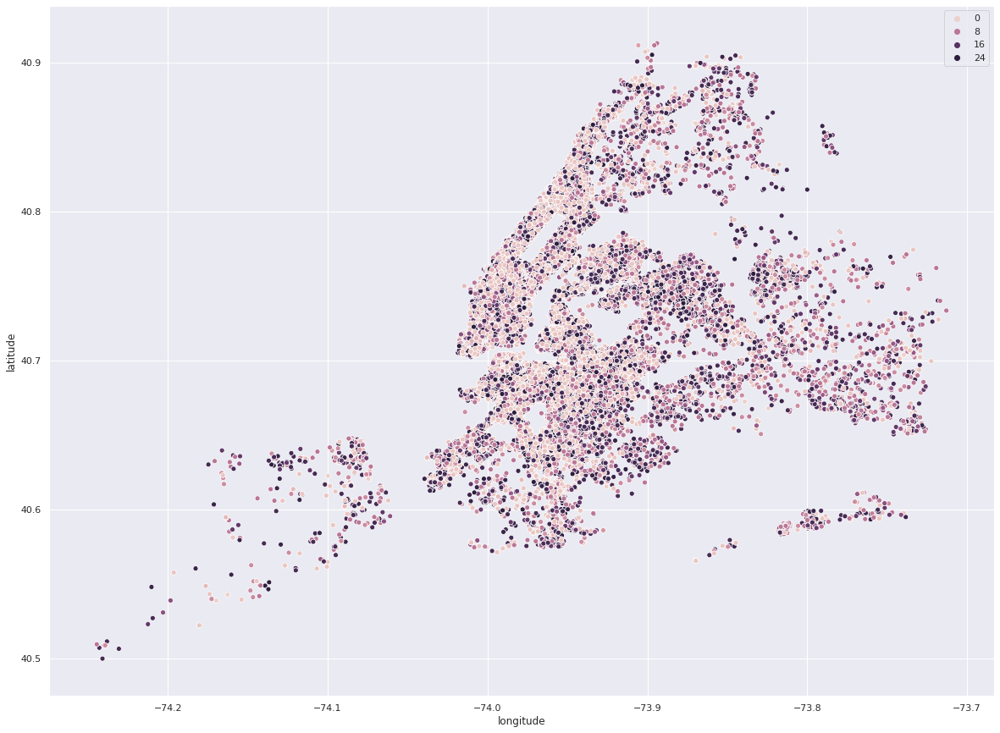

In [0]:
plt.figure(figsize=(20,15))

sns.scatterplot(
    x=df_no_time['longitude'], 
    y=df_no_time['latitude'], 
    hue=k_clusters
    )

plt.show()

The silhouette score for k-means improved to 0.37. The clusters identified on the plot show a lack of separation on this particular plot. 

This plot is based on latitude and longitude so it may not be the best way to view the clusters.

DBSCAN

In [0]:
dbscan = DBSCAN(eps=1.0, min_samples=5, n_jobs=-1)
db_clusters = dbscan.fit_predict(X_stand)

In [0]:
silhouette_score(X_stand, db_clusters, metric='euclidean')

0.3412592753780713

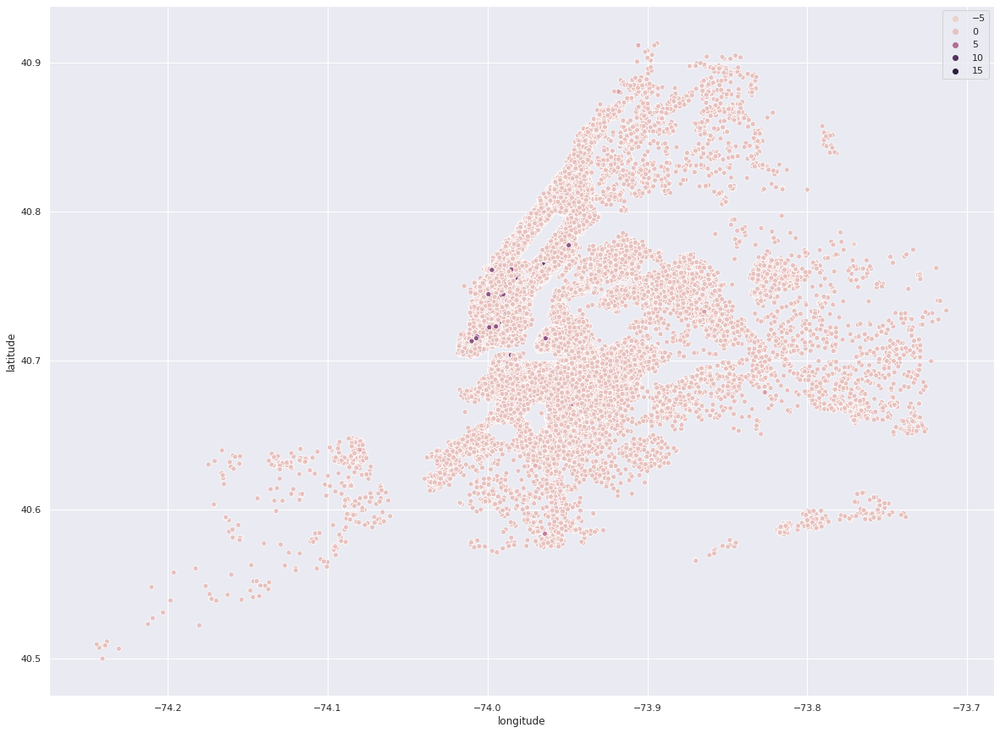

In [0]:
plt.figure(figsize=(20,15))

sns.scatterplot(
    x=df_no_time['longitude'], 
    y=df_no_time['latitude'], 
    hue=db_clusters
    )

plt.show()

DBSCAN performed worse based on both silhouette score and visual separation among clusters.

GMM

Tuning GMM for n_components and reg_covar, and covariance_type.

In [0]:
gmm = GaussianMixture(
    n_components=8, 
    reg_covar=0.1, 
    random_state=2829, 
    covariance_type='full'
    )

gmm_clusters = gmm.fit_predict(X_stand)

In [0]:
params = {
    'n_components' : np.arange(7,10,1), 
    'reg_covar':np.arange(.1, 0.5, .1),
    'covariance_type':['spherical', 'tied', 'full']
    }

grid_gmm = GridSearchCV(gmm, params, n_jobs=-1)

grid_gmm.fit(X_stand)

GridSearchCV(cv=None, error_score=nan,
             estimator=GaussianMixture(covariance_type='full',
                                       init_params='kmeans', max_iter=100,
                                       means_init=None, n_components=8,
                                       n_init=1, precisions_init=None,
                                       random_state=2829, reg_covar=0.1,
                                       tol=0.001, verbose=0,
                                       verbose_interval=10, warm_start=False,
                                       weights_init=None),
             iid='deprecated', n_jobs=-1,
             param_grid={'covariance_type': ['spherical', 'tied', 'full'],
                         'n_components': array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
                         'reg_covar': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [0]:
grid_gmm.best_estimator_

GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
                means_init=None, n_components=8, n_init=1, precisions_init=None,
                random_state=2829, reg_covar=0.1, tol=0.001, verbose=0,
                verbose_interval=10, warm_start=False, weights_init=None)

In [0]:
silhouette_score(X_stand, gmm_clusters, metric='euclidean')

0.39732782637041125

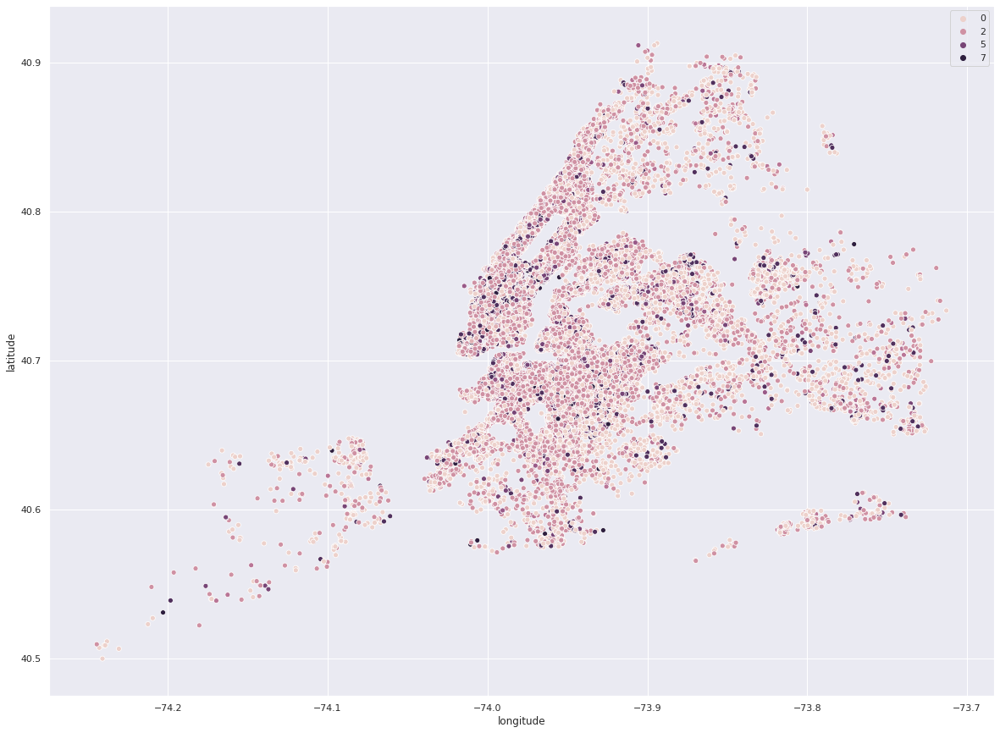

In [0]:
plt.figure(figsize=(20,15))
sns.scatterplot(x=df_no_time['longitude'], y=df_no_time['latitude'], hue=gmm_clusters)
plt.show()

GMM performed better than kmeans or DBSCAN per silhouette score and visual separation among clusters. That said, it is still difficult to easily discern clusters visually from the GMM result, but that could simply be due to this specific visual (i.e. it is geographic and the data are not separating based on geographic factors).


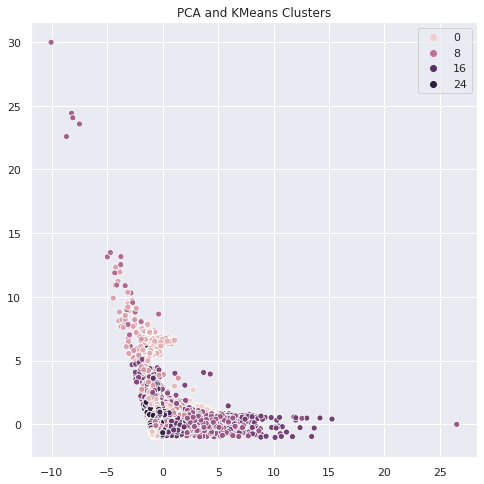

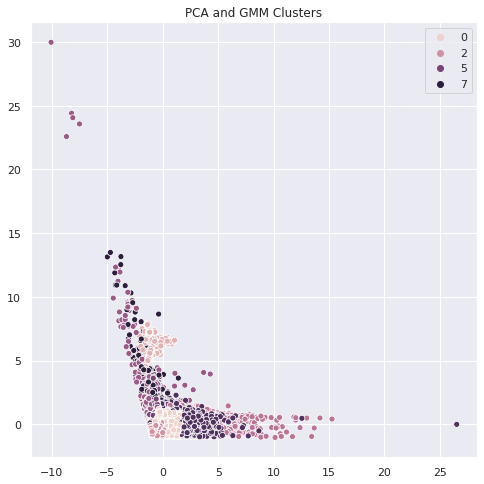

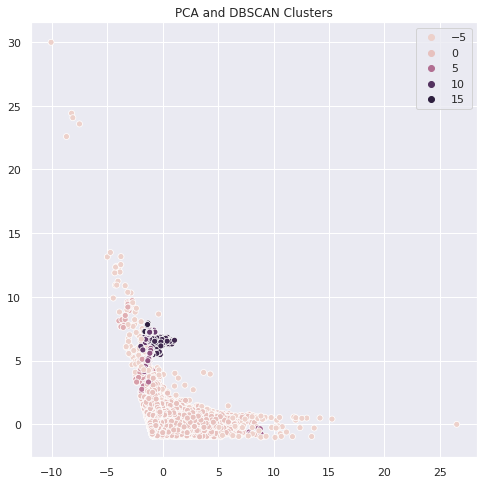

In [0]:
cluster_results = {
    'KMeans': k_clusters, 
    'GMM': gmm_clusters, 
    'DBSCAN': db_clusters
    }

for k,v in cluster_results.items():
    plt.figure(figsize=(8,8))
    sns.scatterplot(x=comps[:,0], y=comps[:,1], hue=v)
    plt.title('PCA and {} Clusters'.format(k))

plt.show()

PCA and the GMM clusters showed really clear separation. The KMeans clusters and PCA showed some separation visually, and the DBSCAN and PCA plot is not well separated.

Based on the number of clusters, visual separation on the PCA components, and silhouette score, I will be using the GMM Clusters for analysis to derive insights for Airbnb hosts.

## Cluster Insights

In [0]:
df_no_time['gmm_clusters'] = gmm_clusters

In [0]:
df_no_time.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,total_cost_rental,gmm_clusters
0,1,1,40.64749,-73.97237,1,149,1,9,0.21,6,365,149,0
1,2,2,40.75362,-73.98377,2,225,1,45,0.38,2,355,225,0
2,2,3,40.80902,-73.94190,1,150,3,0,0.00,1,365,450,0
3,1,4,40.68514,-73.95976,2,89,1,270,4.64,1,194,89,3
4,2,5,40.79851,-73.94399,2,80,10,9,0.10,1,0,800,2


Comparing cluster results across different variables

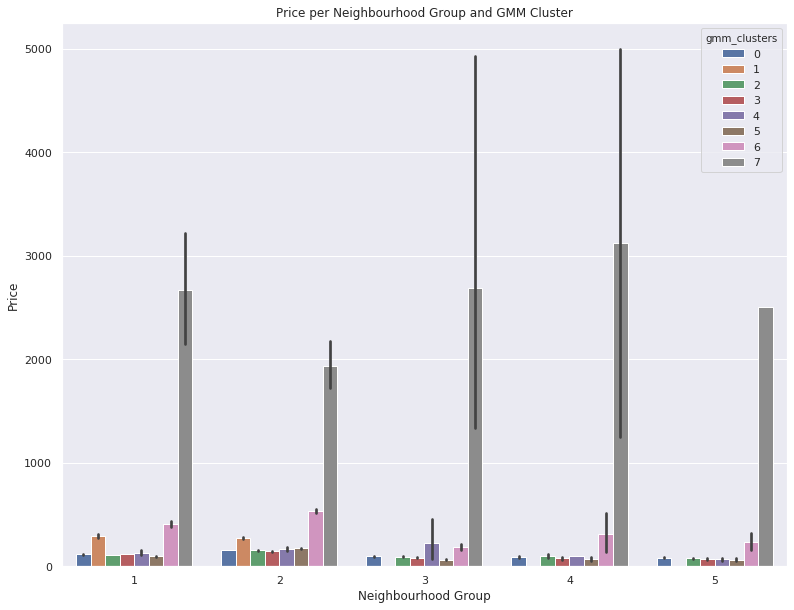

In [0]:
plt.figure(figsize=(13,10))

sns.barplot(
    x=df_no_time['neighbourhood_group'], 
    y=df_no_time['price'], 
    hue=df_no_time['gmm_clusters']
    )

plt.title('Price per Neighbourhood Group and GMM Cluster')
plt.xlabel('neighbourhood_group'.title().replace('_', ' '))
plt.ylabel('price'.title().replace('_', ' '))
plt.show()

The GMM clusters show variance among neighbourhood groups and have information for each cluster.

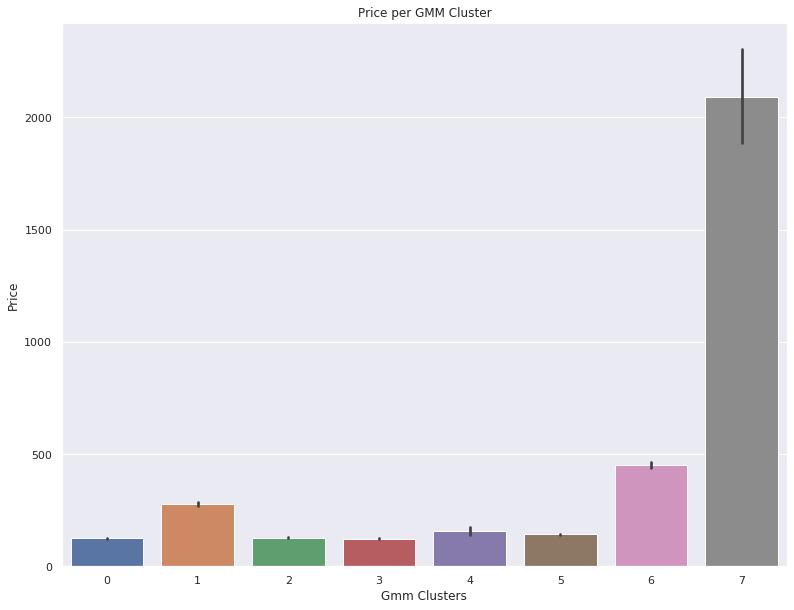

In [0]:
plt.figure(figsize=(13,10))

sns.barplot(
    x=df_no_time['gmm_clusters'], 
    y=df_no_time['price'], 
    )

plt.title('Price per GMM Cluster')
plt.xlabel('gmm_clusters'.title().replace('_', ' '))
plt.ylabel('price'.title().replace('_', ' '))
plt.show()

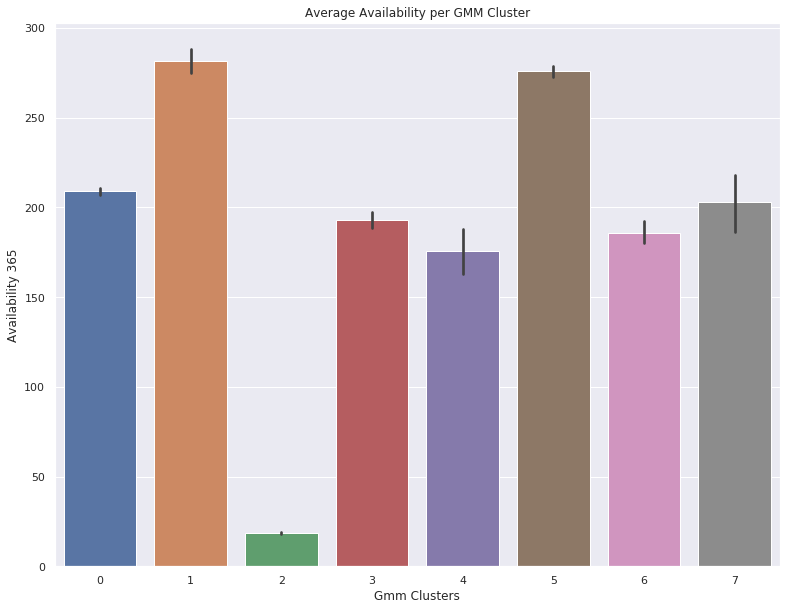

In [0]:
plt.figure(figsize=(13,10))

sns.barplot(
    x=df_no_time['gmm_clusters'], 
    y=df_no_time['availability_365'], 
    )

plt.title('Average Availability per GMM Cluster')
plt.xlabel('gmm_clusters'.title().replace('_', ' '))
plt.ylabel('availability_365'.title().replace('_', ' '))
plt.show()

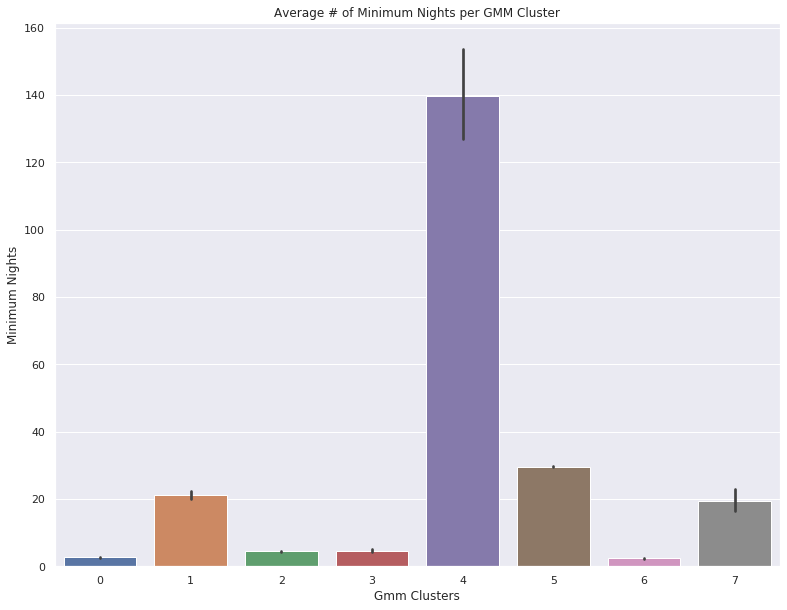

In [0]:
plt.figure(figsize=(13,10))

sns.barplot(
    x=df_no_time['gmm_clusters'], 
    y=df_no_time['minimum_nights'], 
    )

plt.title('Average # of Minimum Nights per GMM Cluster')
plt.xlabel('gmm_clusters'.title().replace('_', ' '))
plt.ylabel('minimum_nights'.title().replace('_', ' '))
plt.show()

Examining descrpitive statistics and correlations matricies for a few of the GMM clusters.

Statistics for GMM cluster 0

In [0]:
gmm_clust_0 = df_no_time[df_no_time['gmm_clusters'] != 0].index
gmm_clust_0_df = df_no_time.drop(gmm_clust_0)
gmm_clust_0_df.describe()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,total_cost_rental,gmm_clusters
count,14808.000000,14808.000000,14808.000000,14808.000000,14808.000000,14808.000000,14808.000000,14808.000000,14808.000000,14808.000000,14808.000000,14808.000000,14808.0
mean,1.901945,38.036534,40.726009,-73.941332,1.507969,124.702120,2.626688,35.850014,1.894328,2.543085,209.046461,336.231159,0.0
std,1.001236,41.901064,0.060796,0.055930,0.563701,80.140895,2.220692,35.062897,1.464075,3.552694,121.450616,380.270800,0.0
min,1.000000,1.000000,40.499790,-74.242850,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0
25%,1.000000,8.000000,40.684430,-73.977740,1.000000,65.000000,1.000000,5.000000,0.600000,1.000000,99.000000,105.000000,0.0
50%,2.000000,22.000000,40.719080,-73.948290,1.000000,100.000000,2.000000,24.000000,1.740000,1.000000,222.000000,209.000000,0.0
75%,2.000000,54.000000,40.763415,-73.921620,2.000000,160.000000,3.000000,59.000000,2.930000,3.000000,324.000000,420.000000,0.0
max,5.000000,221.000000,40.913060,-73.712990,3.000000,555.000000,26.000000,144.000000,7.380000,47.000000,365.000000,6624.000000,0.0


Correlation Matrix for GMM cluster 0

In [0]:
gmm_clust_0_df.corr()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,total_cost_rental,gmm_clusters
neighbourhood_group,1.000000,0.534860,0.514224,0.334242,-0.044206,-0.083710,-0.064092,-0.068795,-0.002347,-0.003388,0.067547,-0.086108,NaN
neighbourhood,0.534860,1.000000,-0.124880,0.377816,-0.027637,-0.197574,-0.059764,-0.101438,-0.035344,-0.004754,0.109055,-0.152001,NaN
latitude,0.514224,-0.124880,1.000000,0.113704,-0.046474,0.058597,-0.014009,0.002148,0.015009,-0.016683,-0.041536,0.027333,NaN
longitude,0.334242,0.377816,0.113704,1.000000,-0.091141,-0.254632,-0.074162,-0.049920,0.018050,0.011028,0.060735,-0.193966,NaN
room_type,-0.044206,-0.027637,-0.046474,-0.091141,1.000000,0.409308,0.066362,0.050988,0.042764,-0.094292,-0.025779,0.301550,NaN
price,-0.083710,-0.197574,0.058597,-0.254632,0.409308,1.000000,0.048762,-0.027984,-0.103921,-0.087237,0.082718,0.610527,NaN
minimum_nights,-0.064092,-0.059764,-0.014009,-0.074162,0.066362,0.048762,1.000000,-0.058776,-0.231877,-0.091371,0.075163,0.688415,NaN
number_of_reviews,-0.068795,-0.101438,0.002148,-0.049920,0.050988,-0.027984,-0.058776,1.000000,0.418771,-0.111241,-0.340241,-0.045277,NaN
reviews_per_month,-0.002347,-0.035344,0.015009,0.018050,0.042764,-0.103921,-0.231877,0.418771,1.000000,-0.088227,-0.534008,-0.197815,NaN
calculated_host_listings_count,-0.003388,-0.004754,-0.016683,0.011028,-0.094292,-0.087237,-0.091371,-0.111241,-0.088227,1.000000,0.164389,-0.133795,NaN


Statistics for GMM cluster 4

In [0]:
gmm_clust_4 = df_no_time[df_no_time['gmm_clusters'] != 4].index
gmm_clust_4_df = df_no_time.drop(gmm_clust_4)
gmm_clust_4_df.describe()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,total_cost_rental,gmm_clusters
count,451.000000,451.000000,451.000000,451.000000,451.000000,451.000000,451.000000,451.000000,451.000000,451.000000,451.000000,451.000000,451.0
mean,1.791574,30.088692,40.735342,-73.963589,1.702882,155.035477,139.558758,13.390244,0.294745,2.762749,175.733925,23754.463415,4.0
std,0.792195,32.448744,0.054454,0.033751,0.512480,189.659212,140.135769,32.988392,0.606361,5.705672,142.198969,62371.809114,0.0
min,1.000000,1.000000,40.579910,-74.079870,1.000000,12.000000,1.000000,0.000000,0.000000,1.000000,0.000000,850.000000,4.0
25%,1.000000,9.000000,40.698685,-73.989650,1.000000,70.000000,60.000000,0.000000,0.000000,1.000000,12.500000,5940.000000,4.0
50%,2.000000,17.000000,40.730850,-73.965960,2.000000,105.000000,90.000000,1.000000,0.060000,1.000000,173.000000,10120.000000,4.0
75%,2.000000,38.000000,40.763430,-73.943845,2.000000,167.000000,180.000000,10.000000,0.285000,2.000000,331.000000,20625.000000,4.0
max,5.000000,205.000000,40.911690,-73.826480,3.000000,2350.000000,1250.000000,314.000000,4.840000,65.000000,365.000000,857750.000000,4.0


Correlation Matrix for GMM cluster 4

In [0]:
gmm_clust_4_df.corr()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,total_cost_rental,gmm_clusters
neighbourhood_group,1.000000,0.509124,0.652557,0.252533,0.109862,0.039747,0.010800,-0.076643,-0.084955,0.101622,0.077033,0.064484,NaN
neighbourhood,0.509124,1.000000,0.013702,0.223069,0.051700,-0.019459,0.013235,-0.055312,-0.035892,0.048485,0.028584,0.058402,NaN
latitude,0.652557,0.013702,1.000000,0.236036,0.047436,-0.009321,-0.003711,-0.060377,-0.073014,0.082351,0.092284,-0.018375,NaN
longitude,0.252533,0.223069,0.236036,1.000000,-0.158245,-0.055627,-0.085718,-0.029765,-0.041253,-0.094068,-0.064210,0.046042,NaN
room_type,0.109862,0.051700,0.047436,-0.158245,1.000000,0.167078,0.027690,0.072466,0.077346,0.195474,0.037366,0.038386,NaN
price,0.039747,-0.019459,-0.009321,-0.055627,0.167078,1.000000,0.079863,0.220327,0.205711,-0.024323,0.111582,0.766881,NaN
minimum_nights,0.010800,0.013235,-0.003711,-0.085718,0.027690,0.079863,1.000000,-0.100951,-0.092636,-0.020050,0.210065,0.476319,NaN
number_of_reviews,-0.076643,-0.055312,-0.060377,-0.029765,0.072466,0.220327,-0.100951,1.000000,0.909677,-0.015965,-0.023737,-0.048342,NaN
reviews_per_month,-0.084955,-0.035892,-0.073014,-0.041253,0.077346,0.205711,-0.092636,0.909677,1.000000,-0.023318,-0.049318,-0.053166,NaN
calculated_host_listings_count,0.101622,0.048485,0.082351,-0.094068,0.195474,-0.024323,-0.020050,-0.015965,-0.023318,1.000000,0.117316,-0.020653,NaN


Statistics for KMeans cluster 7


Correlation Matrix for KMeans cluster 7

In [0]:
gmm_clust_7 = df_no_time[df_no_time['gmm_clusters'] != 7].index
gmm_clust_7_df = df_no_time.drop(gmm_clust_7)
gmm_clust_7_df.describe()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,total_cost_rental,gmm_clusters
count,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,290.000000,2.900000e+02,290.0
mean,1.882759,24.689655,40.739163,-73.975884,1.844828,2092.444828,19.441379,4.213793,0.281931,12.527586,202.748276,4.227034e+04,7.0
std,0.492201,31.592347,0.043250,0.032519,0.381298,1894.663827,26.876592,10.112643,0.624032,20.386769,137.200288,1.206585e+05,0.0
min,1.000000,2.000000,40.530760,-74.202950,1.000000,374.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.295000e+03,7.0
25%,2.000000,3.000000,40.721933,-73.994213,2.000000,748.000000,1.000000,0.000000,0.000000,1.000000,84.000000,2.596500e+03,7.0
50%,2.000000,12.000000,40.750705,-73.975995,2.000000,1500.000000,5.500000,0.000000,0.000000,1.000000,219.500000,1.270000e+04,7.0
75%,2.000000,29.000000,40.760165,-73.965317,2.000000,2500.000000,30.000000,3.000000,0.317500,12.000000,351.250000,2.512500e+04,7.0
max,5.000000,196.000000,40.886710,-73.770690,3.000000,10000.000000,180.000000,84.000000,6.150000,121.000000,365.000000,1.170000e+06,7.0


In [0]:
gmm_clust_7_df.corr()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,total_cost_rental,gmm_clusters
neighbourhood_group,1.000000,0.207937,0.475517,-0.085175,0.142411,-0.067971,-0.007845,0.016871,-0.022355,0.109636,0.105268,0.027243,NaN
neighbourhood,0.207937,1.000000,-0.500088,-0.222035,-0.017225,0.190879,-0.062742,-0.001860,0.008327,-0.363578,-0.076457,0.069078,NaN
latitude,0.475517,-0.500088,1.000000,0.186436,0.039738,-0.101169,0.021422,0.052902,-0.009975,0.184494,0.075694,-0.042157,NaN
longitude,-0.085175,-0.222035,0.186436,1.000000,-0.050097,-0.008162,-0.027227,-0.071216,0.087881,0.102131,0.025815,-0.011577,NaN
room_type,0.142411,-0.017225,0.039738,-0.050097,1.000000,-0.085615,-0.131054,0.110036,0.072375,0.211768,0.027560,-0.179751,NaN
price,-0.067971,0.190879,-0.101169,-0.008162,-0.085615,1.000000,0.031339,-0.041739,0.001833,-0.343242,-0.109379,0.466408,NaN
minimum_nights,-0.007845,-0.062742,0.021422,-0.027227,-0.131054,0.031339,1.000000,-0.011208,-0.123651,0.101531,0.184289,0.702698,NaN
number_of_reviews,0.016871,-0.001860,0.052902,-0.071216,0.110036,-0.041739,-0.011208,1.000000,0.558991,-0.084753,0.017634,-0.027060,NaN
reviews_per_month,-0.022355,0.008327,-0.009975,0.087881,0.072375,0.001833,-0.123651,0.558991,1.000000,0.056019,0.038395,-0.081887,NaN
calculated_host_listings_count,0.109636,-0.363578,0.184494,0.102131,0.211768,-0.343242,0.101531,-0.084753,0.056019,1.000000,0.145318,-0.101974,NaN


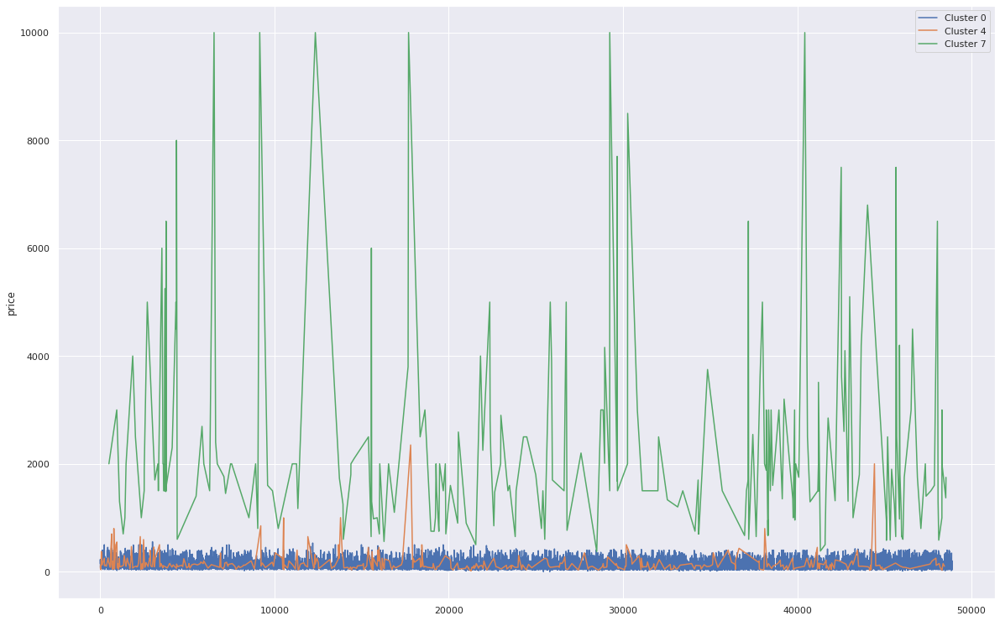

In [0]:
plt.figure(figsize=(20,13))
sns.lineplot(x=gmm_clust_0_df.index, y=gmm_clust_0_df['price'])
sns.lineplot(x=gmm_clust_4_df.index, y=gmm_clust_4_df['price'])
sns.lineplot(x=gmm_clust_7_df.index, y=gmm_clust_7_df['price'])
plt.legend(labels=['Cluster 0', 'Cluster 4', 'Cluster 7'])
plt.show()

## Conclusion

In conclusion, the GMM clusters were the most useful for the intended purpose of making recommendations for listings. 

In making this determination, I tried 3 cluster models and compared them based on silhouette scores, and visual separation of clusters. Each model was tuned for the most significant hyperparameters, where possible.

The silhouette scores were similar among the KMeans, GMM, and DBSCAN models ranging from 0.278 to 0.39. However, upon plotting the GMM clusters compared to the other models, GMM proved to have more information for the purpose of comparing listings across the identified clusters for that model. 

The visualizations I used during EDA were intended to visualize the trends and insights in the data. For visualizing the data broadly I used dimensionality reduction methods UMAP, t-SNE, and PCA. I plotted each feature in the model over these dimensionality reduction methods to look at any patterns or trends.

Finally I viusualized the plots of the clusters over the latitude and longitude of New York City to see the disrtibution. 

To make recommendations to hosts for future listings and/or optimizing existing listings, the GMM clusters reflected insights seen during EDA of the data. For example, the higher prices in certain neighbourhood groups, and the variance in price based on room type.

Based on those clusters gained from GMM, the descriptve statistics and correlations would allow me to make recommendations to hosts based on their information across the same variables (price, availability, room type, neighbourhood, neighbourhood group, etc...). Then, I can identify similar listings in the KMeans clusters and make recommendations.

To do this, the next steps I would take would be to convert the categorical variables back to strings to make easier use of searching the clustered data to make recommendations. I could even create a tool where Airbnb hosts could enter their information and the tool could return recommendations to optimize a given parameter (i.e. price, number of reviews, or availability).

Weak Points & Additional Research 

This project removed the time series component. This project could be done again using that information. Additionally, more feature engineering could be done to potentially increase the capacity for recommendations after clustering has occurred.